In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
import plotly.io as pio
pio.renderers.default='notebook'
py.init_notebook_mode(connected=True)

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import (accuracy_score, 
                            classification_report,
                            roc_auc_score, roc_curve, auc, precision_recall_curve,
                            confusion_matrix)

from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold, KFold

from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

import shap

pd.set_option('display.max_rows', 250)

In [2]:
data=pd.read_csv("C:/TMLC/PROJECT 4 (PATIENT)/Dataset/Patient Survival Detection/Dataset.csv")
data_dict=pd.read_csv("C:/TMLC/PROJECT 4 (PATIENT)/Dataset/Patient Survival Detection/Data Dictionary.csv")

In [3]:
data

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.730000,0,Caucasian,M,180.3,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.420000,0,Caucasian,F,160.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.950000,0,Caucasian,F,172.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.640000,1,Caucasian,F,165.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,91592,78108,30,0,75.0,23.060250,0,Caucasian,M,177.8,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular
91709,66119,13486,121,0,56.0,47.179671,0,Caucasian,F,183.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
91710,8981,58179,195,0,48.0,27.236914,0,Caucasian,M,170.2,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
91711,33776,120598,66,0,NaN,23.297481,0,Caucasian,F,154.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory


In [4]:
data.columns

Index(['encounter_id', 'patient_id', 'hospital_id', 'hospital_death', 'age',
       'bmi', 'elective_surgery', 'ethnicity', 'gender', 'height',
       ...
       'aids', 'cirrhosis', 'diabetes_mellitus', 'hepatic_failure',
       'immunosuppression', 'leukemia', 'lymphoma',
       'solid_tumor_with_metastasis', 'apache_3j_bodysystem',
       'apache_2_bodysystem'],
      dtype='object', length=186)

In [5]:
data.describe()

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,...,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
count,91713.000000,91713.000000,91713.000000,91713.000000,87485.000000,88284.000000,91713.000000,90379.000000,91713.000000,91713.000000,...,83766.000000,83766.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000
mean,65606.079280,65537.131464,105.669262,0.086302,62.309516,29.185818,0.183736,169.641588,508.357692,0.835766,...,0.086787,0.043955,0.000857,0.015693,0.225192,0.012989,0.026165,0.007066,0.004132,0.020638
std,37795.088538,37811.252183,62.854406,0.280811,16.775119,8.275142,0.387271,10.795378,228.989661,2.487756,...,0.247569,0.217341,0.029265,0.124284,0.417711,0.113229,0.159628,0.083763,0.064148,0.142169
min,1.000000,1.000000,2.000000,0.000000,16.000000,14.844926,0.000000,137.200000,82.000000,-24.947222,...,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32852.000000,32830.000000,47.000000,0.000000,52.000000,23.641975,0.000000,162.500000,369.000000,0.035417,...,0.020000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,65665.000000,65413.000000,109.000000,0.000000,65.000000,27.654655,0.000000,170.100000,504.000000,0.138889,...,0.050000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,98342.000000,98298.000000,161.000000,0.000000,75.000000,32.930206,0.000000,177.800000,679.000000,0.409028,...,0.130000,0.060000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,131051.000000,131051.000000,204.000000,1.000000,89.000000,67.814990,1.000000,195.590000,927.000000,159.090972,...,0.990000,0.970000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [6]:
data_dict

,Category,Variable Name,Unit of Measure,Data Type,Description,Example
0,identifier,encounter_id,NaN,integer,Unique identifier associated with a patient un...,NaN
1,identifier,hospital_id,NaN,integer,Unique identifier associated with a hospital,NaN
2,identifier,patient_id,NaN,integer,Unique identifier associated with a patient,NaN
3,demographic,hospital_death,NaN,binary,Whether the patient died during this hospitali...,0
4,demographic,age,Years,numeric,The age of the patient on unit admission,NaN
5,demographic,bmi,kilograms/metres^2,string,The body mass index of the person on unit admi...,21.5
6,demographic,elective_surgery,NaN,binary,Whether the patient was admitted to the hospit...,0
7,demographic,ethnicity,NaN,string,The common national or cultural tradition whic...,Caucasian
8,demographic,gender,NaN,string,The genotypical sex of the patient,F
9,demographic,height,centimetres,numeric,The height of the person on unit admission,180


In [7]:
data['hospital_death'].value_counts()

hospital_death
0    83798
1     7915
Name: count, dtype: int64

In [8]:
data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91713 entries, 0 to 91712
Data columns (total 186 columns):
 #    Column                         Dtype  
---   ------                         -----  
 0    encounter_id                   int64  
 1    patient_id                     int64  
 2    hospital_id                    int64  
 3    hospital_death                 int64  
 4    age                            float64
 5    bmi                            float64
 6    elective_surgery               int64  
 7    ethnicity                      object 
 8    gender                         object 
 9    height                         float64
 10   hospital_admit_source          object 
 11   icu_admit_source               object 
 12   icu_id                         int64  
 13   icu_stay_type                  object 
 14   icu_type                       object 
 15   pre_icu_los_days               float64
 16   readmission_status             int64  
 17   weight                       

In [9]:
empty_count=data.isnull().sum(axis=0).sort_values(ascending=False)
empty_count

h1_bilirubin_min                 84619
h1_bilirubin_max                 84619
h1_lactate_max                   84369
h1_lactate_min                   84369
h1_albumin_max                   83824
h1_albumin_min                   83824
h1_pao2fio2ratio_min             80195
h1_pao2fio2ratio_max             80195
h1_arterial_ph_max               76424
h1_arterial_ph_min               76424
h1_hco3_max                      76094
h1_hco3_min                      76094
h1_arterial_pco2_min             75959
h1_arterial_pco2_max             75959
h1_wbc_max                       75953
h1_wbc_min                       75953
h1_arterial_po2_max              75945
h1_arterial_po2_min              75945
h1_calcium_max                   75863
h1_calcium_min                   75863
h1_platelets_max                 75673
h1_platelets_min                 75673
h1_bun_max                       75091
h1_bun_min                       75091
h1_creatinine_max                74957
h1_creatinine_min        

<Axes: >

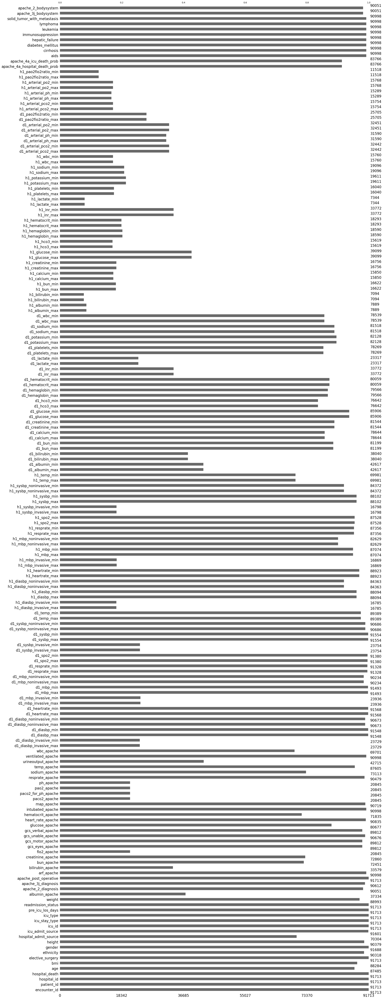

In [10]:
import missingno as msno
msno.bar(data)

<Axes: >

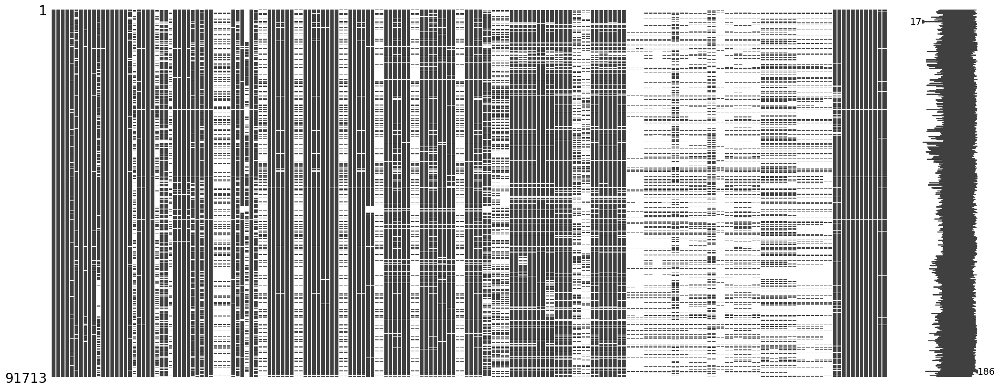

In [11]:
msno.matrix(data)

In [12]:
print("Number of rows with missing values:", data.isnull().any(axis=1).sum())

Number of rows with missing values: 91688


In [13]:
large_missing=data.isna().sum(axis=0).sort_values(ascending=False)[data.isna().sum(axis=0).sort_values(ascending=False)>25000]
print("\nTotal features with more than", 25000, "missing values:", len(large_missing))

data.drop(large_missing.index.tolist() + ['encounter_id', 'hospital_admit_source', 'icu_admit_source', 'icu_id', 'icu_stay_type', 'patient_id', 'hospital_id', 'readmission_status'], 
              axis=1,
             inplace = True)
data


Total features with more than 25000 missing values: 74


,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,icu_type,pre_icu_los_days,weight,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,0,68.0,22.730000,0,Caucasian,M,180.3,CTICU,0.541667,73.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,0,77.0,27.420000,0,Caucasian,F,160.0,Med-Surg ICU,0.927778,70.2,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,0,25.0,31.950000,0,Caucasian,F,172.7,Med-Surg ICU,0.000694,95.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,0,81.0,22.640000,1,Caucasian,F,165.1,CTICU,0.000694,61.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,0,19.0,NaN,0,Caucasian,M,188.0,Med-Surg ICU,0.073611,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,0,75.0,23.060250,0,Caucasian,M,177.8,Cardiac ICU,0.298611,72.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular
91709,0,56.0,47.179671,0,Caucasian,F,183.0,Med-Surg ICU,0.120139,158.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
91710,0,48.0,27.236914,0,Caucasian,M,170.2,Med-Surg ICU,0.046528,78.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
91711,0,NaN,23.297481,0,Caucasian,F,154.9,Med-Surg ICU,0.081944,55.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory


In [14]:
data

,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,icu_type,pre_icu_los_days,weight,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,0,68.0,22.730000,0,Caucasian,M,180.3,CTICU,0.541667,73.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,0,77.0,27.420000,0,Caucasian,F,160.0,Med-Surg ICU,0.927778,70.2,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,0,25.0,31.950000,0,Caucasian,F,172.7,Med-Surg ICU,0.000694,95.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,0,81.0,22.640000,1,Caucasian,F,165.1,CTICU,0.000694,61.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,0,19.0,NaN,0,Caucasian,M,188.0,Med-Surg ICU,0.073611,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,0,75.0,23.060250,0,Caucasian,M,177.8,Cardiac ICU,0.298611,72.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular
91709,0,56.0,47.179671,0,Caucasian,F,183.0,Med-Surg ICU,0.120139,158.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
91710,0,48.0,27.236914,0,Caucasian,M,170.2,Med-Surg ICU,0.046528,78.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
91711,0,NaN,23.297481,0,Caucasian,F,154.9,Med-Surg ICU,0.081944,55.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory


In [15]:
data.nunique()

hospital_death                       2
age                                 74
bmi                              34888
elective_surgery                     2
ethnicity                            6
gender                               2
height                             401
icu_type                             8
pre_icu_los_days                  9757
weight                            3409
apache_2_diagnosis                  44
apache_3j_diagnosis                399
apache_post_operative                2
arf_apache                           2
bun_apache                         476
creatinine_apache                 1127
gcs_eyes_apache                      4
gcs_motor_apache                     6
gcs_unable_apache                    2
gcs_verbal_apache                    5
glucose_apache                     565
heart_rate_apache                  149
hematocrit_apache                  353
intubated_apache                     2
map_apache                         161
resprate_apache          

In [16]:
data=data[data[['height', 'weight', 'bmi']].isna().sum(axis=1)==0]
data
#we are dropping rows with missing values in height, weight and bmi columns

,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,icu_type,pre_icu_los_days,weight,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,0,68.0,22.730000,0,Caucasian,M,180.3,CTICU,0.541667,73.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,0,77.0,27.420000,0,Caucasian,F,160.0,Med-Surg ICU,0.927778,70.2,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,0,25.0,31.950000,0,Caucasian,F,172.7,Med-Surg ICU,0.000694,95.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,0,81.0,22.640000,1,Caucasian,F,165.1,CTICU,0.000694,61.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
5,0,67.0,27.560000,0,Caucasian,M,190.5,Med-Surg ICU,0.000694,100.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,0,75.0,23.060250,0,Caucasian,M,177.8,Cardiac ICU,0.298611,72.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular
91709,0,56.0,47.179671,0,Caucasian,F,183.0,Med-Surg ICU,0.120139,158.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
91710,0,48.0,27.236914,0,Caucasian,M,170.2,Med-Surg ICU,0.046528,78.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
91711,0,NaN,23.297481,0,Caucasian,F,154.9,Med-Surg ICU,0.081944,55.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory


In [24]:
data.isna().sum()

hospital_death                       0
age                               4055
bmi                                  0
elective_surgery                     0
ethnicity                         1211
gender                              18
height                               0
icu_type                             0
pre_icu_los_days                     0
weight                               0
apache_2_diagnosis                1566
apache_3j_diagnosis               1026
apache_post_operative                0
arf_apache                         684
bun_apache                       18289
creatinine_apache                17926
gcs_eyes_apache                   1794
gcs_motor_apache                  1794
gcs_unable_apache                  951
gcs_verbal_apache                 1794
glucose_apache                   10473
heart_rate_apache                  809
hematocrit_apache                19005
intubated_apache                   684
map_apache                         913
resprate_apache          

Univariate and multi-variate analysis

In [17]:
fig=px.histogram(data[['age', 'gender', 'hospital_death', 'bmi']], x='age', y='hospital_death',
                 color='gender', marginal='box', hover_data=data[['age', 'gender', 'hospital_death', 'bmi']].columns)
fig.show()
#majority of deaths are female

In [18]:
age_death_F=data[data['gender']=='F'][['age','hospital_death']].groupby('age').mean().reset_index()
age_death_M=data[data['gender']=='M'][['age','hospital_death']].groupby('age').mean().reset_index()
from plotly.subplots import make_subplots
fig = make_subplots()
fig.add_trace(
    go.Scatter(x=age_death_F['age'], y=age_death_F['hospital_death'], name="Female patients"))
fig.add_trace(
    go.Scatter(x=age_death_M['age'], y=age_death_M['hospital_death'],name="Male patients"))
fig.update_layout(
    title_text="<b>Average hospital death probability of patients<b>")
fig.update_xaxes(title_text="<b>patient age<b>")
fig.update_yaxes(title_text="<b>Average Hospital Death</b>", secondary_y=False)
fig.show()

In [19]:
weight_df=data[['weight','hospital_death','bmi']]
weight_df['weight']=weight_df['weight'].round(0)
weight_df['bmi']=weight_df['bmi'].round(0)
weight_death=weight_df[['weight','hospital_death']].groupby('weight').mean().reset_index()
bmi_death=weight_df[['bmi','hospital_death']].groupby('bmi').mean().reset_index()
fig = make_subplots(rows=1, cols=1, shared_yaxes=True)
fig.add_trace(
    go.Scatter(x=weight_death['weight'], y=weight_death['hospital_death'], name="Weight"),
)
fig.add_trace(
    go.Scatter(x=bmi_death['bmi'], y=bmi_death['hospital_death'], name="BMI"),
)
fig.update_layout(
    title_text="<b>impacts of BMI and weight over patients<b>"
)
fig.update_yaxes(title_text="<b>Average Hospital Death")
fig.show()

In [20]:
ICU_type=data[['icu_type','age','hospital_death']]
ICU_type['icu_type']=ICU_type['icu_type'].replace({'CTICU':'CCU-CTICU',
                                              'Cardiac ICU':'CCT-CTICU',
                                              'CTICU':'CCT-CTICU',
                                              'CSICU':'SICU'})
#ICU_type['pre_icu_los_days']=ICU_type['pre_icu_los_days'].round(0)
ICU_df=ICU_type.groupby(['icu_type','age']).mean().reset_index()
ICU_df['count']=ICU_type.groupby(['icu_type','age']).count().reset_index()['hospital_death']

fig = px.scatter(ICU_df, x="age", y="hospital_death", size="count", color="icu_type",
           hover_name="icu_type", log_x=False, size_max=60,)
fig.update_layout(
    title_text="<b>Survival rate at different types of ICU<b>"
)
fig.update_yaxes(title_text="<b>Average Hospital Death<b>")
fig.update_xaxes(title_text="<b>Age<b>")
fig.show()

In [21]:
apache3=data[['age','apache_3j_bodysystem','hospital_death']]
apache3=apache3.groupby(['apache_3j_bodysystem','age']).agg(['size','mean']).reset_index()

apache3['size']=apache3['hospital_death']['size']
apache3['mean']=apache3['hospital_death']['mean']

apache3.drop('hospital_death',axis=1,inplace=True)

systems =list(apache3['apache_3j_bodysystem'].unique())
data_disp = []
list_updatemenus = []
for n, s in enumerate(systems):
    visible = [False] * len(systems)
    visible[n] = True
    temp_dict = dict(label = str(s),
                 method = 'update',
                 args = [{'visible': visible},
                         {'title': '<b>'+s+'<b>'}])
    list_updatemenus.append(temp_dict)
    

for s in systems:
    mask = (apache3['apache_3j_bodysystem'].values == s) 
    trace = (dict(visible = False,     
        x = apache3.loc[mask, 'age'],
        y = apache3.loc[mask, 'mean'],
        mode = 'markers',
        marker = {'size':apache3.loc[mask, 'size']/apache3.loc[mask,'size'].sum()*1000,
                 'color':apache3.loc[mask, 'mean'],
                 'showscale': True})
                   )
    data_disp.append(trace)

data_disp[0]['visible'] = True    
    
layout = dict(updatemenus=list([dict(buttons= list_updatemenus)]),
              xaxis=dict(title = '<b>Age<b>', range=[min(apache3.loc[:, 'age'])-10, max(apache3.loc[:, 'age']) + 10]),
              yaxis=dict(title = '<b>Average Hospital Death<b>', range=[min(apache3.loc[:, 'mean'])-0.1, max(apache3.loc[:, 'mean'])+0.1]),
              title='<b>Survival Rate<b>' )
fig = dict(data=data_disp, layout=layout)
py.iplot(fig, filename='update_dropdown')

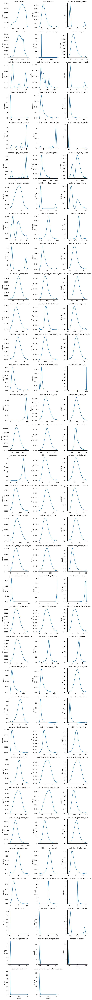

In [23]:
unpivot = pd.melt(data, data.describe().columns[0], data.describe().columns[1:])

g = sns.FacetGrid(unpivot, col="variable", col_wrap=3, sharex=False, sharey=False)
g.map(sns.kdeplot, "value")

plt.show()

DATA PREPROCESSING

In [25]:
data.nunique()[data.nunique() == 2].index.tolist()

['hospital_death',
 'elective_surgery',
 'gender',
 'apache_post_operative',
 'arf_apache',
 'gcs_unable_apache',
 'intubated_apache',
 'ventilated_apache',
 'aids',
 'cirrhosis',
 'diabetes_mellitus',
 'hepatic_failure',
 'immunosuppression',
 'leukemia',
 'lymphoma',
 'solid_tumor_with_metastasis']

In [26]:
data.select_dtypes(include='O').columns.values.tolist()

['ethnicity',
 'gender',
 'icu_type',
 'apache_3j_bodysystem',
 'apache_2_bodysystem']

In [44]:
numerical_cat=['elective_surgery',
 'apache_post_operative',
 'arf_apache',
 'gcs_unable_apache',
 'intubated_apache',
 'ventilated_apache',
 'aids',
 'cirrhosis',
 'diabetes_mellitus',
 'hepatic_failure',
 'immunosuppression',
 'leukemia',
 'lymphoma',
 'solid_tumor_with_metastasis']

categorical=['ethnicity',
 'gender',
 'icu_type',
 'apache_3j_bodysystem',
 'apache_2_bodysystem']

In [45]:
not_numeric=data[numerical_cat+categorical+['hospital_death']].columns.tolist()
numeric_only=data.drop(not_numeric, axis=1).columns.tolist()

In [49]:
numeric_only

['age',
 'bmi',
 'height',
 'pre_icu_los_days',
 'weight',
 'apache_2_diagnosis',
 'apache_3j_diagnosis',
 'bun_apache',
 'creatinine_apache',
 'gcs_eyes_apache',
 'gcs_motor_apache',
 'gcs_verbal_apache',
 'glucose_apache',
 'heart_rate_apache',
 'hematocrit_apache',
 'map_apache',
 'resprate_apache',
 'sodium_apache',
 'temp_apache',
 'wbc_apache',
 'd1_diasbp_max',
 'd1_diasbp_min',
 'd1_diasbp_noninvasive_max',
 'd1_diasbp_noninvasive_min',
 'd1_heartrate_max',
 'd1_heartrate_min',
 'd1_mbp_max',
 'd1_mbp_min',
 'd1_mbp_noninvasive_max',
 'd1_mbp_noninvasive_min',
 'd1_resprate_max',
 'd1_resprate_min',
 'd1_spo2_max',
 'd1_spo2_min',
 'd1_sysbp_max',
 'd1_sysbp_min',
 'd1_sysbp_noninvasive_max',
 'd1_sysbp_noninvasive_min',
 'd1_temp_max',
 'd1_temp_min',
 'h1_diasbp_max',
 'h1_diasbp_min',
 'h1_diasbp_noninvasive_max',
 'h1_diasbp_noninvasive_min',
 'h1_heartrate_max',
 'h1_heartrate_min',
 'h1_mbp_max',
 'h1_mbp_min',
 'h1_mbp_noninvasive_max',
 'h1_mbp_noninvasive_min',
 'h1_re

In [50]:
for col in numerical_cat:
    data[col] = data[col].astype('Int64')
    
for col in numerical_cat:
    data[col] = data[col].fillna(data[col].mode()[0])

In [51]:
data[numeric_only].isna().sum(axis=0).sort_values(ascending=False)

wbc_apache                       21063
h1_temp_max                      20833
h1_temp_min                      20833
hematocrit_apache                19005
bun_apache                       18289
creatinine_apache                17926
sodium_apache                    17644
d1_hco3_max                      14390
d1_hco3_min                      14390
d1_platelets_min                 12767
d1_platelets_max                 12767
d1_wbc_max                       12501
d1_wbc_min                       12501
d1_calcium_min                   12315
d1_calcium_max                   12315
d1_hemaglobin_max                11519
d1_hemaglobin_min                11519
d1_hematocrit_max                11051
d1_hematocrit_min                11051
glucose_apache                   10473
d1_bun_min                        9860
d1_bun_max                        9860
d1_creatinine_min                 9561
d1_creatinine_max                 9561
d1_sodium_max                     9554
d1_sodium_min            

In [52]:
split_one = data[numeric_only].isna().sum(axis=0).sort_values()[data[numeric_only].isna().sum(axis=0) < 11000].index.tolist()
split_two = data[numeric_only].isna().sum(axis=0).sort_values()[data[numeric_only].isna().sum(axis=0) > 11000].index.tolist()

In [53]:
split_two

['d1_hematocrit_max',
 'd1_hematocrit_min',
 'd1_hemaglobin_min',
 'd1_hemaglobin_max',
 'd1_calcium_max',
 'd1_calcium_min',
 'd1_wbc_max',
 'd1_wbc_min',
 'd1_platelets_min',
 'd1_platelets_max',
 'd1_hco3_max',
 'd1_hco3_min',
 'sodium_apache',
 'creatinine_apache',
 'bun_apache',
 'hematocrit_apache',
 'h1_temp_min',
 'h1_temp_max',
 'wbc_apache']

In [60]:
split_one

['bmi',
 'height',
 'pre_icu_los_days',
 'weight',
 'd1_heartrate_min',
 'd1_heartrate_max',
 'd1_sysbp_min',
 'd1_sysbp_max',
 'd1_diasbp_min',
 'd1_diasbp_max',
 'd1_mbp_max',
 'd1_mbp_min',
 'd1_spo2_min',
 'd1_spo2_max',
 'd1_resprate_max',
 'd1_resprate_min',
 'heart_rate_apache',
 'map_apache',
 'd1_sysbp_noninvasive_max',
 'd1_sysbp_noninvasive_min',
 'd1_diasbp_noninvasive_min',
 'd1_diasbp_noninvasive_max',
 'apache_3j_diagnosis',
 'resprate_apache',
 'd1_mbp_noninvasive_min',
 'd1_mbp_noninvasive_max',
 'apache_2_diagnosis',
 'gcs_motor_apache',
 'gcs_verbal_apache',
 'gcs_eyes_apache',
 'd1_temp_min',
 'd1_temp_max',
 'h1_heartrate_max',
 'h1_heartrate_min',
 'h1_sysbp_min',
 'h1_sysbp_max',
 'h1_diasbp_min',
 'h1_diasbp_max',
 'temp_apache',
 'h1_spo2_max',
 'h1_spo2_min',
 'age',
 'h1_resprate_max',
 'h1_resprate_min',
 'h1_mbp_max',
 'h1_mbp_min',
 'd1_glucose_min',
 'd1_glucose_max',
 'h1_sysbp_noninvasive_min',
 'h1_sysbp_noninvasive_max',
 'h1_diasbp_noninvasive_max',


In [54]:
for col in split_two:
    data[col] = data[col].fillna(data[col].mean())

process_data = data.dropna(axis=0)

In [59]:
process_data.isna().sum()

hospital_death                   0
age                              0
bmi                              0
elective_surgery                 0
ethnicity                        0
gender                           0
height                           0
icu_type                         0
pre_icu_los_days                 0
weight                           0
apache_2_diagnosis               0
apache_3j_diagnosis              0
apache_post_operative            0
arf_apache                       0
bun_apache                       0
creatinine_apache                0
gcs_eyes_apache                  0
gcs_motor_apache                 0
gcs_unable_apache                0
gcs_verbal_apache                0
glucose_apache                   0
heart_rate_apache                0
hematocrit_apache                0
intubated_apache                 0
map_apache                       0
resprate_apache                  0
sodium_apache                    0
temp_apache                      0
ventilated_apache   

In [61]:
process_data.dtypes

hospital_death                     int64
age                              float64
bmi                              float64
elective_surgery                   Int64
ethnicity                         object
gender                            object
height                           float64
icu_type                          object
pre_icu_los_days                 float64
weight                           float64
apache_2_diagnosis               float64
apache_3j_diagnosis              float64
apache_post_operative              Int64
arf_apache                         Int64
bun_apache                       float64
creatinine_apache                float64
gcs_eyes_apache                  float64
gcs_motor_apache                 float64
gcs_unable_apache                  Int64
gcs_verbal_apache                float64
glucose_apache                   float64
heart_rate_apache                float64
hematocrit_apache                float64
intubated_apache                   Int64
map_apache      

In [68]:
process_data

,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,icu_type,pre_icu_los_days,weight,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,0,68.0,22.730000,0,Caucasian,M,180.3,CTICU,0.541667,73.9,...,0,0,1,0,0,0,0,0,Sepsis,Cardiovascular
1,0,77.0,27.420000,0,Caucasian,F,160.0,Med-Surg ICU,0.927778,70.2,...,0,0,1,0,0,0,0,0,Respiratory,Respiratory
5,0,67.0,27.560000,0,Caucasian,M,190.5,Med-Surg ICU,0.000694,100.0,...,0,0,1,0,0,0,0,0,Neurological,Neurologic
17,0,46.0,25.845717,0,Hispanic,M,167.6,CTICU,0.000000,72.6,...,0,0,0,0,0,0,0,0,Respiratory,Respiratory
23,0,87.0,21.963763,0,Caucasian,M,180.3,MICU,5.046528,71.4,...,0,0,0,0,0,0,0,0,Sepsis,Cardiovascular
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91698,0,47.0,51.439842,1,Caucasian,M,195.0,Med-Surg ICU,0.033333,186.0,...,0,0,0,0,0,0,0,0,Gastrointestinal,Gastrointestinal
91706,0,54.0,19.770448,0,Native American,M,177.8,Med-Surg ICU,0.025694,62.5,...,0,0,0,0,0,0,0,0,Cardiovascular,Cardiovascular
91708,0,75.0,23.060250,0,Caucasian,M,177.8,Cardiac ICU,0.298611,72.9,...,0,0,1,0,0,0,0,1,Sepsis,Cardiovascular
91709,0,56.0,47.179671,0,Caucasian,F,183.0,Med-Surg ICU,0.120139,158.0,...,0,0,0,0,0,0,0,0,Sepsis,Cardiovascular


In [65]:
encode_data=process_data.select_dtypes(include='object')

In [70]:
encode_data.head()

,ethnicity,gender,icu_type,apache_3j_bodysystem,apache_2_bodysystem
0,2,1,2,9,0
1,2,0,5,8,6
5,2,1,5,7,4
17,3,1,2,8,6
23,2,1,4,9,0


In [69]:
def ordinal_encoding(df, feats): 
    for feat in feats:    
        feat_val = list(np.arange(df[feat].nunique()))
        feat_key = list(df[feat].sort_values().unique())
        feat_dict = dict(zip(feat_key, feat_val))
        df[feat] = df[feat].map(feat_dict)
    return df

encoded_df = ordinal_encoding(encode_data, encode_data.columns)
encoded_df.head()                               

,ethnicity,gender,icu_type,apache_3j_bodysystem,apache_2_bodysystem
0,2,1,2,9,0
1,2,0,5,8,6
5,2,1,5,7,4
17,3,1,2,8,6
23,2,1,4,9,0


In [71]:
data_temp=process_data.drop(encode_data.columns, axis=1)    

In [72]:
data_temp

,hospital_death,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,...,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
0,0,68.0,22.730000,0,180.3,0.541667,73.9,113.0,502.01,0,...,0.10,0.05,0,0,1,0,0,0,0,0
1,0,77.0,27.420000,0,160.0,0.927778,70.2,108.0,203.01,0,...,0.47,0.29,0,0,1,0,0,0,0,0
5,0,67.0,27.560000,0,190.5,0.000694,100.0,301.0,403.01,0,...,0.05,0.02,0,0,1,0,0,0,0,0
17,0,46.0,25.845717,0,167.6,0.000000,72.6,108.0,203.01,0,...,0.11,0.06,0,0,0,0,0,0,0,0
23,0,87.0,21.963763,0,180.3,5.046528,71.4,113.0,501.05,0,...,0.31,0.14,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91698,0,47.0,51.439842,1,195.0,0.033333,186.0,304.0,1406.01,1,...,0.01,0.00,0,0,0,0,0,0,0,0
91706,0,54.0,19.770448,0,177.8,0.025694,62.5,109.0,108.01,0,...,0.01,0.00,0,0,0,0,0,0,0,0
91708,0,75.0,23.060250,0,177.8,0.298611,72.9,113.0,501.06,0,...,0.12,0.05,0,0,1,0,0,0,0,1
91709,0,56.0,47.179671,0,183.0,0.120139,158.0,113.0,501.05,0,...,0.03,0.02,0,0,0,0,0,0,0,0


In [73]:
data_final=pd.concat([data_temp, encoded_df], axis=1)

In [74]:
data_final.head()

,hospital_death,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,...,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ethnicity,gender,icu_type,apache_3j_bodysystem,apache_2_bodysystem
0,0,68.0,22.730000,0,180.3,0.541667,73.9,113.0,502.01,0,...,0,0,0,0,0,2,1,2,9,0
1,0,77.0,27.420000,0,160.0,0.927778,70.2,108.0,203.01,0,...,0,0,0,0,0,2,0,5,8,6
5,0,67.0,27.560000,0,190.5,0.000694,100.0,301.0,403.01,0,...,0,0,0,0,0,2,1,5,7,4
17,0,46.0,25.845717,0,167.6,0.000000,72.6,108.0,203.01,0,...,0,0,0,0,0,3,1,2,8,6
23,0,87.0,21.963763,0,180.3,5.046528,71.4,113.0,501.05,0,...,0,0,0,0,0,2,1,4,9,0


In [78]:
#save csv
data_final.to_csv("C:/TMLC/PROJECT 4 (PATIENT)/Dataset/Patient Survival Detection/processed_data.csv", index=False)

In [3]:
data_final=pd.read_csv("C:/TMLC/PROJECT 4 (PATIENT)/Dataset/Patient Survival Detection/processed_data.csv")

FEATURE SELECTION

In [4]:
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.model_selection import train_test_split


def select_features_corr_based(X_train, y_train, X_test, x=10):
    if type(x)==str:
        fs_corr=SelectKBest(score_func=f_regression, k='all')
    else:
        fs_corr=SelectKBest(score_func=f_regression, k=x)

    fs_corr.fit(X_train, y_train)
    X_train_fs=fs_corr.transform(X_train)
    X_test_fs=fs_corr.transform(X_test)

    return X_train_fs, X_test_fs, fs_corr


In [5]:
X=data_final.drop('hospital_death', axis=1)
y=data_final['hospital_death']

X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.2, random_state=1)

X_train_fs, X_test_fs, fs_corr=select_features_corr_based(X_train, y_train, X_test)

Feature d1_sysbp_noninvasive_min: 1804.100109
Feature d1_sysbp_min: 1810.973521
Feature d1_spo2_min: 1919.138672
Feature d1_temp_min: 2048.723868
Feature ventilated_apache: 2366.983630
Feature gcs_verbal_apache: 2546.438653
Feature gcs_eyes_apache: 2873.427969
Feature gcs_motor_apache: 3458.272512
Feature apache_4a_icu_death_prob: 5844.069986
Feature apache_4a_hospital_death_prob: 6582.940287


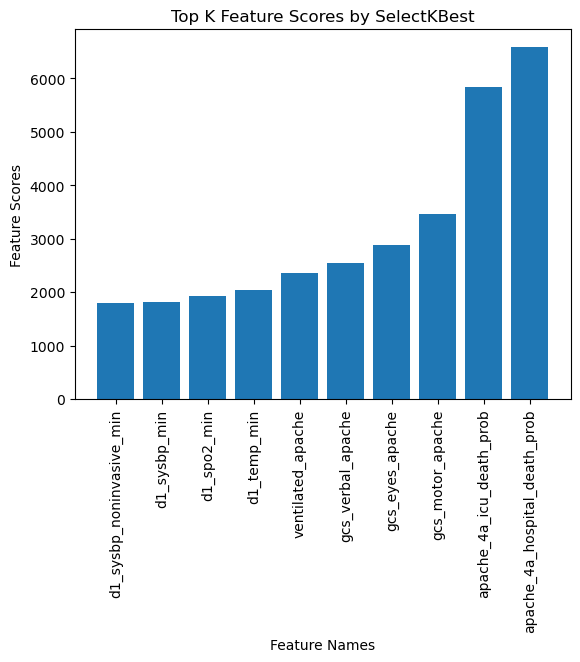

In [6]:

def fs_score_plot(X_train, fs_func):
    feature_scores = fs_func.scores_
    feature_names = X_train.columns
    
    # Get the indices of the top k features
    top_k_indices = np.argsort(feature_scores)[-fs_func.k:]
    top_k_features = feature_names[top_k_indices]
    top_k_scores = feature_scores[top_k_indices]
    
    # Print the scores of the top k features
    for name, score in zip(top_k_features, top_k_scores):
        print('Feature %s: %f' % (name, score))
    
    # Plot the scores of the top k features
    plt.bar(top_k_features, top_k_scores)
    plt.xticks(rotation=90)
    plt.xlabel('Feature Names')
    plt.ylabel('Feature Scores')
    plt.title('Top K Feature Scores by SelectKBest')
    plt.show()

fs_score_plot(X_train, fs_corr)



In [7]:
def select_features_infogain_based(X_train, y_train, X_test, x=10):
    if type(x)==str:
        fs_info=SelectKBest(score_func=mutual_info_regression, k='all')
    else:
        fs_info=SelectKBest(score_func=mutual_info_regression, k=x)

    fs_info.fit(X_train, y_train)
    X_train_fs=fs_info.transform(X_train)
    X_test_fs=fs_info.transform(X_test)

    return X_train_fs, X_test_fs, fs_info

In [8]:
X_train_ig, X_test_ig, fs_ig=select_features_infogain_based(X_train, y_train, X_test)

Feature d1_temp_min: 0.022546
Feature d1_bun_max: 0.023249
Feature gcs_eyes_apache: 0.025275
Feature d1_sysbp_min: 0.026745
Feature gcs_verbal_apache: 0.027082
Feature apache_2_diagnosis: 0.027648
Feature gcs_motor_apache: 0.032195
Feature apache_3j_diagnosis: 0.035820
Feature apache_4a_hospital_death_prob: 0.072747
Feature apache_4a_icu_death_prob: 0.083107


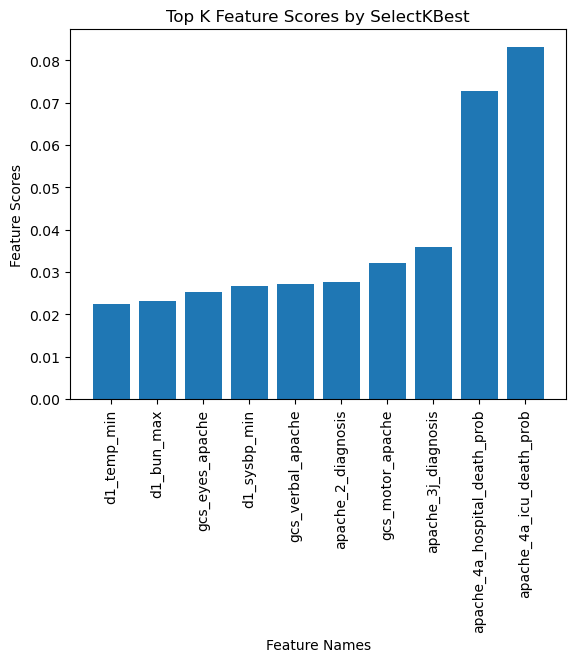

In [9]:
fs_score_plot(X_train, fs_ig)

In [10]:
X_train['apache_4a_icu_death_prob']

44451    0.02
3985     0.33
4277     0.07
22157   -1.00
29320    0.01
         ... 
50057    0.02
32511    0.00
5192     0.01
12172    0.01
33003    0.03
Name: apache_4a_icu_death_prob, Length: 42490, dtype: float64

Now building neural network for X_traing and X_train_fs

In [23]:
# importing relevent libraries
import pathlib
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import PIL
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation
from sklearn.preprocessing import MinMaxScaler

In [24]:
scaler=MinMaxScaler()
X_train_scaled=scaler.fit_transform(X_train_fs)
X_test_scaled=scaler.transform(X_test_fs)

In [25]:
import joblib
joblib.dump(scaler, "C:/TMLC/PROJECT 4 (PATIENT)/scaler.pkl")

['C:/TMLC/PROJECT 4 (PATIENT)/scaler.pkl']

In [15]:

col=['d1_sysbp_noninvasive_min', 'd1_sysbp_min', 'd1_spo2_min', 'd1_temp_min', 'ventilated_apache', 'gcs_verbal_apache', 'gcs_eyes_apache', 'gcs_motor_apache',
    'apache_4a_icu_death_prob', 'apache_4a_hospital_death_prob']

In [16]:
X_trainfs_new = pd.DataFrame(X_train_scaled, columns= col)
X_testfs_new = pd.DataFrame(X_test_scaled, columns= col)

In [30]:
X_trainfs_new

,d1_sysbp_noninvasive_min,d1_sysbp_min,d1_spo2_min,d1_temp_min,ventilated_apache,gcs_verbal_apache,gcs_eyes_apache,gcs_motor_apache,apache_4a_icu_death_prob,apache_4a_hospital_death_prob
0,0.666667,1.0,0.00,1.0,0.91,0.445378,0.445238,0.695483,0.520202,0.517766
1,1.000000,0.8,0.50,1.0,0.70,0.739496,0.739430,0.729318,0.747475,0.675127
2,1.000000,1.0,1.00,0.0,0.91,0.285714,0.285534,0.712401,0.560606,0.543147
3,1.000000,0.8,0.00,0.0,0.96,0.554622,0.554510,0.543224,0.000000,0.000000
4,0.666667,1.0,1.00,0.0,0.91,0.411765,0.411616,0.780071,0.515152,0.512690
...,...,...,...,...,...,...,...,...,...,...
42485,1.000000,1.0,1.00,0.0,0.91,0.436975,0.436833,0.729318,0.525253,0.517766
42486,1.000000,1.0,1.00,0.0,0.89,0.680672,0.680592,0.780071,0.510101,0.507614
42487,1.000000,1.0,1.00,0.0,0.90,0.571429,0.571321,0.746236,0.515152,0.512690
42488,0.666667,1.0,1.00,0.0,0.97,0.445378,0.445238,0.695483,0.510101,0.512690


In [31]:
X_testfs_new

,d1_sysbp_noninvasive_min,d1_sysbp_min,d1_spo2_min,d1_temp_min,ventilated_apache,gcs_verbal_apache,gcs_eyes_apache,gcs_motor_apache,apache_4a_icu_death_prob,apache_4a_hospital_death_prob
0,1.000000,1.0,0.5,1.0,0.98,0.655462,0.655375,0.763153,0.535354,0.517766
1,0.333333,0.6,0.0,1.0,0.89,0.369748,0.369589,0.661648,0.641414,0.588832
2,1.000000,1.0,1.0,0.0,0.92,0.394958,0.394805,0.577060,0.570707,0.543147
3,0.666667,0.8,0.0,1.0,0.94,0.319328,0.319156,0.813906,0.515152,0.512690
4,1.000000,1.0,1.0,0.0,0.93,0.428571,0.428427,0.864659,0.510101,0.507614
...,...,...,...,...,...,...,...,...,...,...
10618,0.666667,1.0,1.0,0.0,0.92,0.789916,0.789863,0.813906,0.520202,0.517766
10619,1.000000,1.0,1.0,0.0,0.94,0.470588,0.470455,0.695483,0.530303,0.517766
10620,1.000000,1.0,1.0,0.0,0.96,0.386555,0.386400,0.746236,0.722222,0.614213
10621,1.000000,1.0,1.0,0.0,0.60,0.117647,0.117425,0.813906,0.601010,0.573604


In [17]:
X_trainsc=scaler.fit_transform(X_train)
X_testsc=scaler.transform(X_test)

In [18]:
X_train_new = pd.DataFrame(X_trainsc, columns= X_train.columns)
X_test_new = pd.DataFrame(X_testsc, columns= X_test.columns)

Now what we have is=>
1. Feature selected df->X_trainfs_new and X_testfs_new (top 10 features)
2. All features df->X_train_new and X_test_new

Now we will train on both and check accuracy

### Model 1: Creating the Basic Deep Learning Model 

In [37]:
model=Sequential()
model.add(Dense(64, input_shape=(X_train_new.shape[1],), activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [38]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         6,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,281 (36.25 KB)

 Trainable params: 9,281 (36.25 KB)

 Non-trainable params: 0 (0.00 B)

In [39]:
# metrics that might be useful for present project
metrics = [
    keras.metrics.Precision(name="precision"),
    keras.metrics.Recall(name="recall"),
    keras.metrics.AUC(curve='ROC')
]


### Compiling the model
### choosing an appropirate optimiser and loss function
model.compile(optimizer=keras.optimizers.Adam(0.01),
              loss='binary_crossentropy',
              metrics=metrics)

In [41]:
X_train_new

,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,...,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ethnicity,gender,icu_type,apache_3j_bodysystem,apache_2_bodysystem
0,0.863014,0.246844,1.0,0.782668,0.019563,0.371777,1.000000,0.526657,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.4,1.0,0.142857,0.0,1.000000
1,0.986301,0.144008,0.0,0.565165,0.003634,0.179783,0.057971,0.190492,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.4,0.0,0.714286,0.9,0.000000
2,0.794521,0.131062,0.0,0.520637,0.003758,0.153324,0.057971,0.190477,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.4,0.0,0.714286,0.9,0.000000
3,0.410959,0.174779,0.0,0.477822,0.004542,0.183853,0.975845,0.052418,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.4,1.0,1.000000,0.8,0.666667
4,0.452055,0.090311,0.0,0.527488,0.012048,0.113976,0.053140,0.002857,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.4,0.0,0.428571,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42485,0.739726,0.403808,0.0,0.435006,0.003686,0.388060,0.077295,0.002381,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.4,0.0,0.571429,0.0,0.000000
42486,0.767123,0.309634,0.0,0.520637,0.003634,0.333582,0.975845,0.052418,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.4,1.0,0.000000,0.8,0.666667
42487,0.684932,0.237006,0.0,0.565165,0.005502,0.276594,0.057971,0.190496,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.4,0.0,0.428571,0.9,0.000000
42488,0.821918,0.147117,1.0,0.563453,0.003727,0.182497,0.487923,0.525228,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.4,1.0,0.142857,0.0,0.000000


In [42]:
epochs=50
batch_size=32
history=model.fit(X_train_new, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_test_new, y_test))

Epoch 1/50
1328/1328 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - auc: 0.7844 - loss: 0.2531 - precision: 0.3794 - recall: 0.0578 - val_auc: 0.8690 - val_loss: 0.2022 - val_precision: 0.6192 - val_recall: 0.2625
Epoch 2/50
1328/1328 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - auc: 0.8475 - loss: 0.2288 - precision: 0.6262 - recall: 0.2252 - val_auc: 0.8704 - val_loss: 0.2110 - val_precision: 0.5717 - val_recall: 0.3194
Epoch 3/50
1328/1328 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - auc: 0.8573 - loss: 0.2201 - precision: 0.6331 - recall: 0.2457 - val_auc: 0.8717 - val_loss: 0.1997 - val_precision: 0.6889 - val_recall: 0.2160
Epoch 4/50
1328/1328 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - auc: 0.8690 - loss: 0.2086 - precision: 0.6635 - recall: 0.2213 - val_auc: 0.8624 - val_loss: 0.2228 - val_precision: 0.7077 - val_recall: 0.1603
Epoch 5/50
1328/1328 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - auc: 0.8687 - loss: 0.2108 - precision: 0.6962 - recall: 0.2541 - val_auc: 0.8726 - val_loss: 0.2006 - val_precision: 0.6443 - val_recal

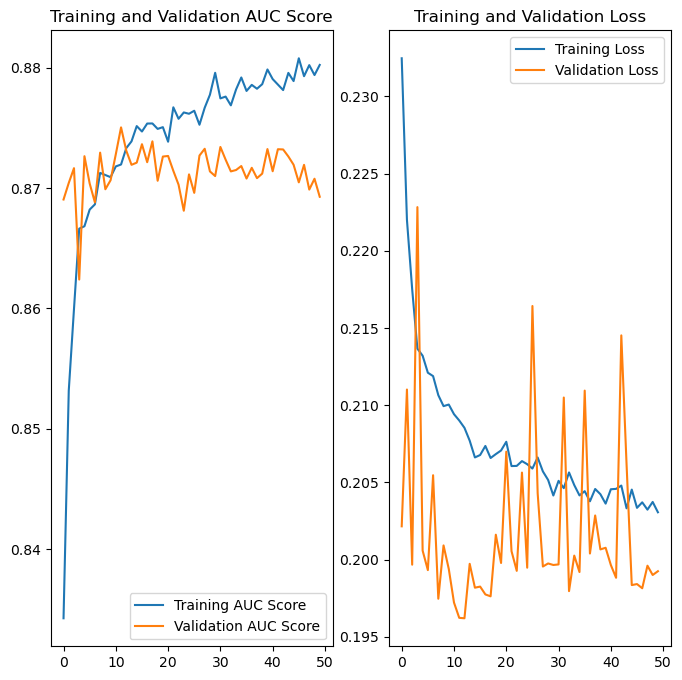

In [43]:
acc = history.history['auc']
val_acc = history.history['val_auc']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training AUC Score')
plt.plot(epochs_range, val_acc, label='Validation AUC Score')
plt.legend(loc='lower right')
plt.title('Training and Validation AUC Score')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

Building model for feature selcted data

In [48]:
model1=Sequential()
model1.add(Dense(64, input_shape=(X_trainfs_new.shape[1],), activation='relu'))
model1.add(Dense(32, activation='relu'))
model1.add(Dense(16, activation='relu'))
model1.add(Dense(1, activation='sigmoid'))

In [49]:
model1.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_8 (Dense)                 │ (None, 64)             │           704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,329 (13.00 KB)

 Trainable params: 3,329 (13.00 KB)

 Non-trainable params: 0 (0.00 B)

In [50]:
# metrics that might be useful for present project
metrics = [
    keras.metrics.Precision(name="precision"),
    keras.metrics.Recall(name="recall"),
    keras.metrics.AUC(curve='ROC')
]


### Compiling the model
### choosing an appropirate optimiser and loss function
model1.compile(optimizer=keras.optimizers.Adam(0.01),
              loss='binary_crossentropy',
              metrics=metrics)

In [51]:
epochs=50
batch_size=32
history=model1.fit(X_trainfs_new, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_testfs_new, y_test))

Epoch 1/50
1328/1328 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - auc_2: 0.7673 - loss: 0.2597 - precision: 0.5362 - recall: 0.1473 - val_auc_2: 0.8318 - val_loss: 0.2175 - val_precision: 0.6332 - val_recall: 0.2567
Epoch 2/50
1328/1328 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - auc_2: 0.8249 - loss: 0.2331 - precision: 0.6304 - recall: 0.2533 - val_auc_2: 0.8472 - val_loss: 0.2106 - val_precision: 0.6712 - val_recall: 0.2276
Epoch 3/50
1328/1328 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - auc_2: 0.8328 - loss: 0.2279 - precision: 0.6243 - recall: 0.2363 - val_auc_2: 0.8535 - val_loss: 0.2042 - val_precision: 0.5951 - val_recall: 0.3089
Epoch 4/50
1328/1328 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - auc_2: 0.8398 - loss: 0.2228 - precision: 0.6396 - recall: 0.2203 - val_auc_2: 0.8597 - val_loss: 0.2028 - val_precision: 0.7566 - val_recall: 0.1661
Epoch 5/50
1328/1328 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - auc_2: 0.8486 - loss: 0.2235 - precision: 0.6386 - recall: 0.2359 - val_auc_2: 0.8565 - val_loss: 0.2073 - val_precision

In [54]:
X_trainfs_new

,d1_sysbp_noninvasive_min,d1_sysbp_min,d1_spo2_min,d1_temp_min,ventilated_apache,gcs_verbal_apache,gcs_eyes_apache,gcs_motor_apache,apache_4a_icu_death_prob,apache_4a_hospital_death_prob
0,0.666667,1.0,0.00,1.0,0.91,0.445378,0.445238,0.695483,0.520202,0.517766
1,1.000000,0.8,0.50,1.0,0.70,0.739496,0.739430,0.729318,0.747475,0.675127
2,1.000000,1.0,1.00,0.0,0.91,0.285714,0.285534,0.712401,0.560606,0.543147
3,1.000000,0.8,0.00,0.0,0.96,0.554622,0.554510,0.543224,0.000000,0.000000
4,0.666667,1.0,1.00,0.0,0.91,0.411765,0.411616,0.780071,0.515152,0.512690
...,...,...,...,...,...,...,...,...,...,...
42485,1.000000,1.0,1.00,0.0,0.91,0.436975,0.436833,0.729318,0.525253,0.517766
42486,1.000000,1.0,1.00,0.0,0.89,0.680672,0.680592,0.780071,0.510101,0.507614
42487,1.000000,1.0,1.00,0.0,0.90,0.571429,0.571321,0.746236,0.515152,0.512690
42488,0.666667,1.0,1.00,0.0,0.97,0.445378,0.445238,0.695483,0.510101,0.512690


In [20]:
import joblib
model1=joblib.load("C:/TMLC/PROJECT 4 (PATIENT)/model.pkl")

In [21]:
test=[0.666667, 1.0,	0.00, 1.0, 0.91, 0.445378, 0.445238, 0.695483, 0.520202, 0.517766]
test_df=pd.DataFrame([test], columns=X_testfs_new.columns)
model1.predict(test_df)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step


array([[0.00759776]], dtype=float32)

In [59]:
import joblib
joblib.dump(model1, 'C:/TMLC/PROJECT 4 (PATIENT)/model.pkl')

['C:/TMLC/PROJECT 4 (PATIENT)/model.pkl']

In [68]:
d=pd.read_csv("C:/TMLC/PROJECT 4 (PATIENT)/Dataset/Patient Survival Detection/processed_data.csv")

In [72]:
d11=d[X_testfs_new.columns]

In [73]:
d11

,d1_sysbp_noninvasive_min,d1_sysbp_min,d1_spo2_min,d1_temp_min,ventilated_apache,gcs_verbal_apache,gcs_eyes_apache,gcs_motor_apache,apache_4a_icu_death_prob,apache_4a_hospital_death_prob
0,73.0,73.0,74.0,37.2,0,4.0,3.0,6.0,0.05,0.10
1,67.0,67.0,70.0,35.1,1,1.0,1.0,3.0,0.29,0.47
2,107.0,107.0,91.0,36.6,0,5.0,4.0,6.0,0.02,0.05
3,102.0,102.0,88.0,36.4,1,1.0,1.0,4.0,0.06,0.11
4,129.0,129.0,90.0,35.6,1,1.0,3.0,6.0,0.14,0.31
...,...,...,...,...,...,...,...,...,...,...
53108,87.0,87.0,93.0,36.5,0,2.0,4.0,6.0,0.00,0.01
53109,90.0,90.0,90.0,36.6,0,5.0,4.0,6.0,0.00,0.01
53110,67.0,67.0,85.0,36.6,1,5.0,4.0,6.0,0.05,0.12
53111,65.0,65.0,45.0,36.1,0,5.0,4.0,6.0,0.02,0.03


In [99]:
d11['d1_sysbp_noninvasive_min'].max()

160.0

d1_sysbp_noninvasive_min:41.03->160
d1_sysbp_min:41->160
d1_spo2_min:0->100
d1_temp_min:31.889->37.8
gcs_eyes_apache->slider 1-4
gcs_motor_apache->slider1-6
apache_4a_icu_death_prob->slider0->1
apache_4a_hospital_death_prob->slider 0->1
options_ventilated_apache=[0, 1]
options_gcs_verbal_apache=[1, 2, 3, 4, 5]